In [1]:
import os
import scenicplus
import scanpy as sc
import warnings
import pandas as pd
import matplotlib as mpl

warnings.simplefilter(action='ignore', category=FutureWarning)
%matplotlib inline
sc.settings.set_figure_params(dpi=80, frameon=False, figsize=(5, 5), facecolor='white')

work_dir = '/media/hani/SSD250/ibp/'
rnaseq_dir = work_dir + 'snRNA-seq/'
rnaseq_output = rnaseq_dir + 'processed/'

# Loading Data

In [2]:
adata = sc.read_mtx(os.path.join(rnaseq_dir, 'snRNA_counts.mtx')).T

In [3]:
genes = pd.read_csv(os.path.join(rnaseq_dir, 'genes.csv'), sep='\t', header=None).iloc[:, -1].values
adata.var = pd.DataFrame(index=genes)

# barcodes = pd.read_csv(os.path.join(rnaseq_dir, 'barcodes_rna.csv'), sep='\t', header=None).iloc[:, -1].values
# adata.obs = pd.DataFrame(index=barcodes)

metadata = pd.read_csv(os.path.join(rnaseq_dir, 'snRNA_metadta.csv'), sep=',') #.iloc[:, -1].values
metadata.index = metadata.iloc[:,0]
metadata = metadata.drop(axis=1, columns=['Unnamed: 0'])
adata.obs = metadata

In [4]:
adata.var_names_make_unique()
adata

AnnData object with n_obs × n_vars = 61472 × 36114
    obs: 'Sample.ID', 'Batch', 'Sex', 'Age', 'Diagnosis', 'UMAP_1', 'UMAP_2', 'cluster', 'celltype'

# Basic Filtering

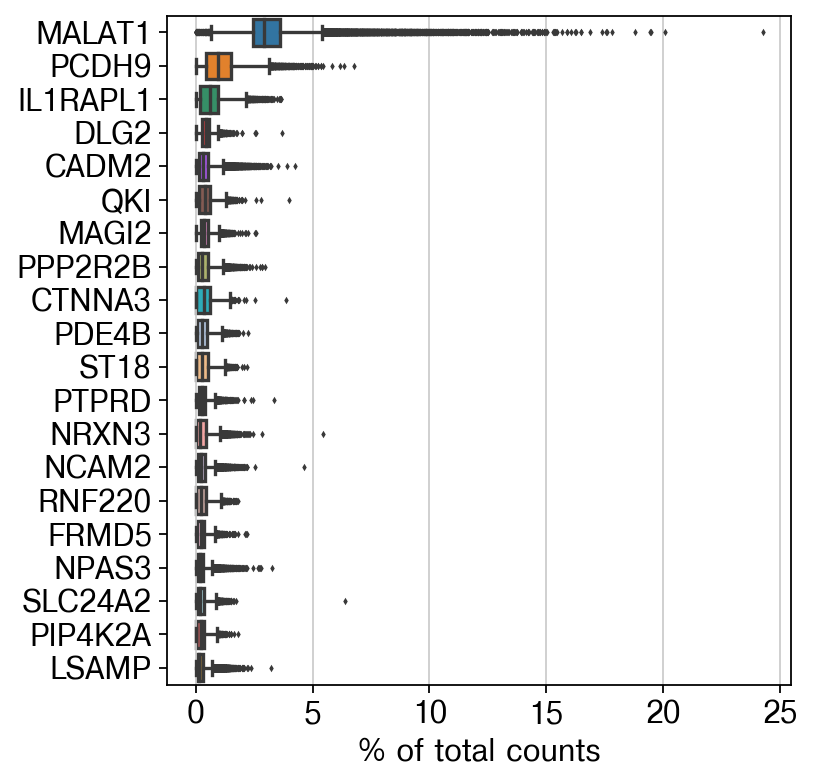

In [5]:
sc.pl.highest_expr_genes(adata, n_top=20, )

In [6]:
sc.pp.filter_cells(adata, min_genes=200)
sc.pp.filter_genes(adata, min_cells=3)

adata

AnnData object with n_obs × n_vars = 61472 × 36066
    obs: 'Sample.ID', 'Batch', 'Sex', 'Age', 'Diagnosis', 'UMAP_1', 'UMAP_2', 'cluster', 'celltype', 'n_genes'
    var: 'n_cells'

In [7]:
sc.external.pp.scrublet(adata)

/home/hani/miniconda3/envs/scenicplus/lib/python3.8/site-packages/scanpy/preprocessing/_normalization.py:155: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


Automatically set threshold at doublet score = 0.40
Detected doublet rate = 0.9%
Estimated detectable doublet fraction = 51.3%
Overall doublet rate:
	Expected   = 5.0%
	Estimated  = 1.7%


In [8]:
adata = adata[adata.obs['predicted_doublet'] == False] #do the actual filtering
adata

View of AnnData object with n_obs × n_vars = 60946 × 36066
    obs: 'Sample.ID', 'Batch', 'Sex', 'Age', 'Diagnosis', 'UMAP_1', 'UMAP_2', 'cluster', 'celltype', 'n_genes', 'doublet_score', 'predicted_doublet'
    var: 'n_cells'
    uns: 'scrublet'

In [9]:
sum(adata.var_names.str.startswith('MT-'))

0

In [10]:
sc.pp.calculate_qc_metrics(adata, qc_vars=[], percent_top=None, log1p=False, inplace=True)
adata

/home/hani/miniconda3/envs/scenicplus/lib/python3.8/site-packages/scanpy/preprocessing/_qc.py:135: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs[obs_metrics.columns] = obs_metrics


AnnData object with n_obs × n_vars = 60946 × 36066
    obs: 'Sample.ID', 'Batch', 'Sex', 'Age', 'Diagnosis', 'UMAP_1', 'UMAP_2', 'cluster', 'celltype', 'n_genes', 'doublet_score', 'predicted_doublet', 'n_genes_by_counts', 'total_counts'
    var: 'n_cells', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'scrublet'

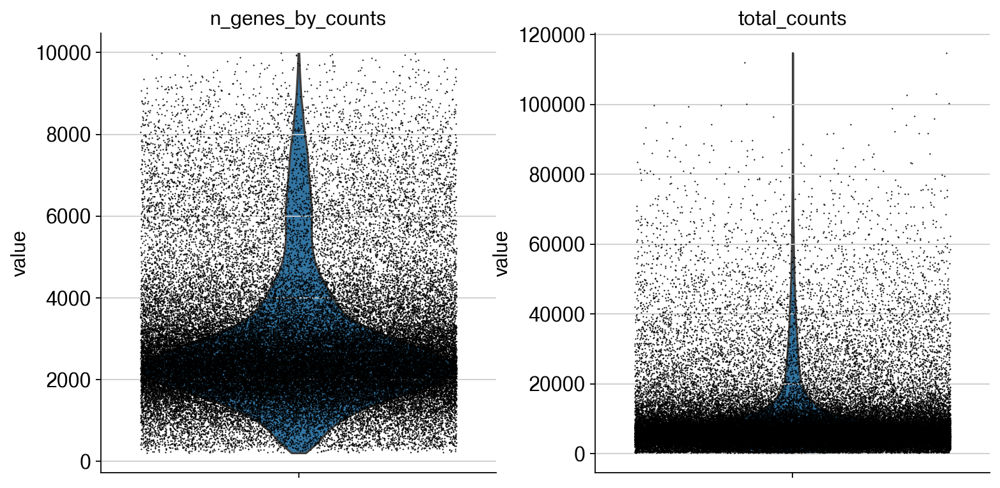

In [11]:
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts'],
             jitter=0.4, multi_panel=True)

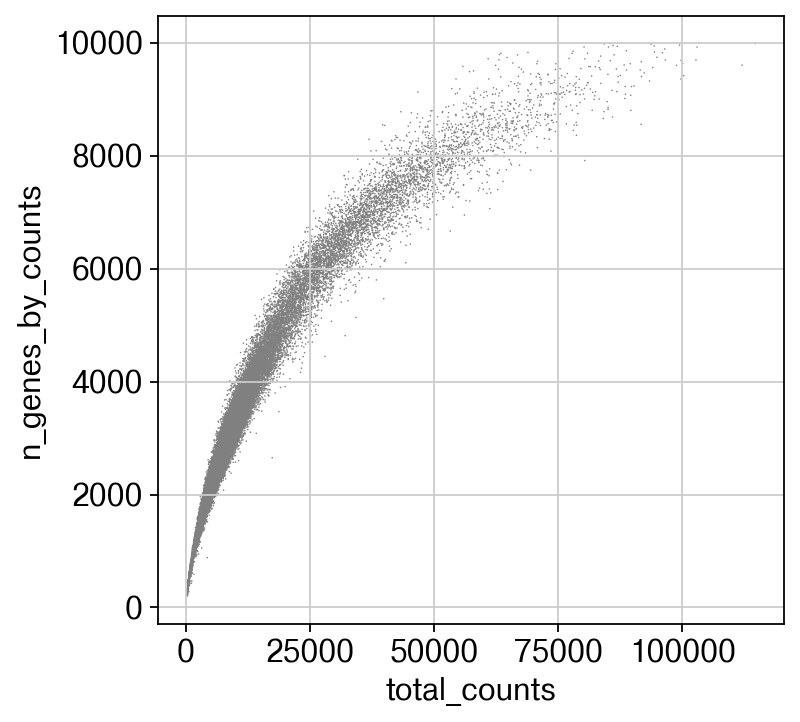

In [12]:
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts')

In [13]:
adata = adata[adata.obs.n_genes_by_counts < 8000, :]
adata

View of AnnData object with n_obs × n_vars = 60082 × 36066
    obs: 'Sample.ID', 'Batch', 'Sex', 'Age', 'Diagnosis', 'UMAP_1', 'UMAP_2', 'cluster', 'celltype', 'n_genes', 'doublet_score', 'predicted_doublet', 'n_genes_by_counts', 'total_counts'
    var: 'n_cells', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'scrublet'

# Data Normalization

In [14]:
adata.raw = adata
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)

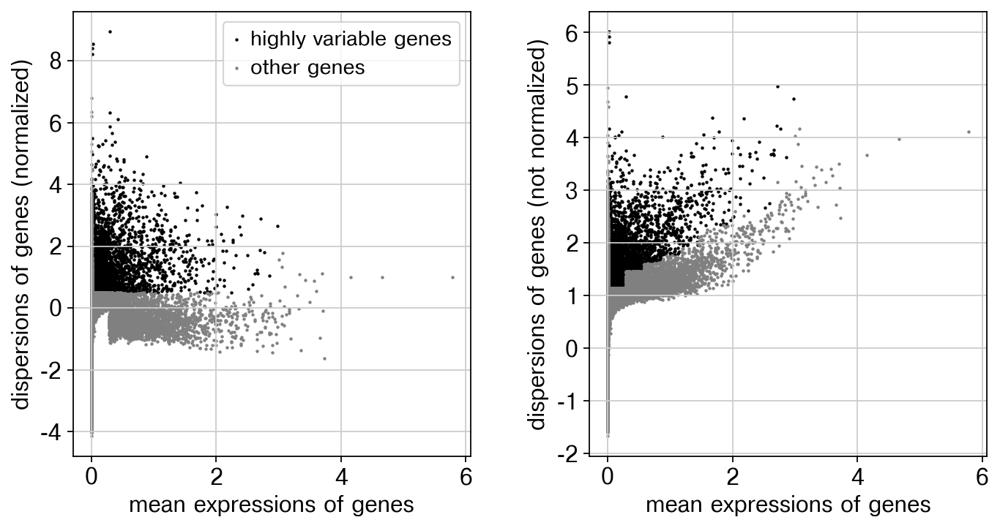

In [15]:
sc.pl.highly_variable_genes(adata)

In [16]:
adata = adata[:, adata.var.highly_variable]
sc.pp.regress_out(adata, ['total_counts', 'Batch'])
sc.pp.scale(adata, max_value=10)
adata

AnnData object with n_obs × n_vars = 60082 × 5354
    obs: 'Sample.ID', 'Batch', 'Sex', 'Age', 'Diagnosis', 'UMAP_1', 'UMAP_2', 'cluster', 'celltype', 'n_genes', 'doublet_score', 'predicted_doublet', 'n_genes_by_counts', 'total_counts'
    var: 'n_cells', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'scrublet', 'log1p', 'hvg'

/home/hani/miniconda3/envs/scenicplus/lib/python3.8/site-packages/scanpy/preprocessing/_normalization.py:182: UserWarning: Some cells have zero counts
  warn(UserWarning('Some cells have zero counts'))


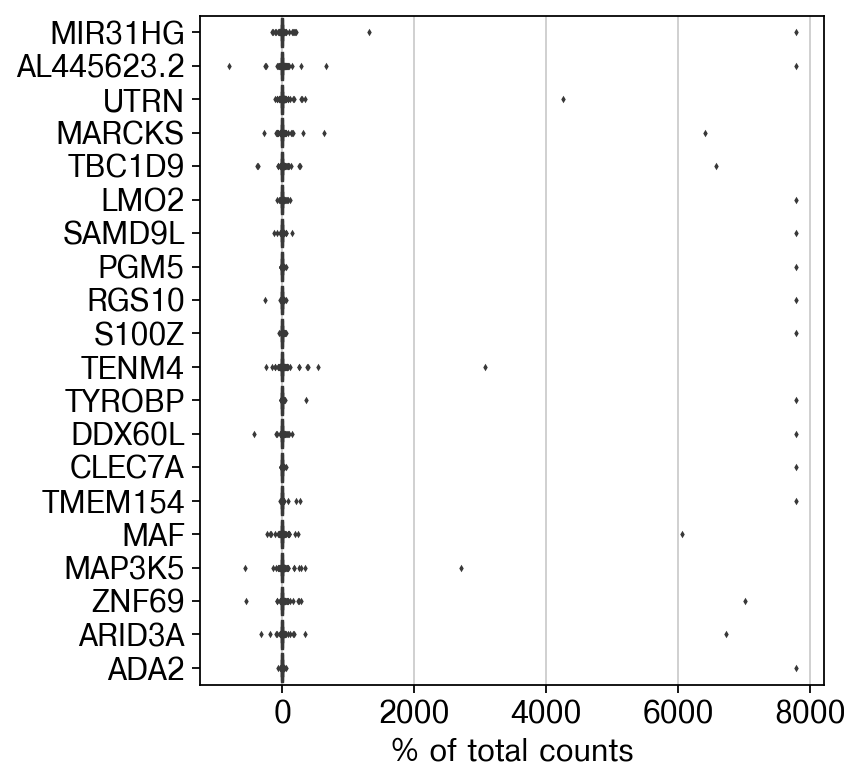

In [17]:
sc.pl.highest_expr_genes(adata, n_top=20, )

# PCA

In [18]:
sc.tl.pca(adata, svd_solver='arpack')

In [19]:
adata

AnnData object with n_obs × n_vars = 60082 × 5354
    obs: 'Sample.ID', 'Batch', 'Sex', 'Age', 'Diagnosis', 'UMAP_1', 'UMAP_2', 'cluster', 'celltype', 'n_genes', 'doublet_score', 'predicted_doublet', 'n_genes_by_counts', 'total_counts'
    var: 'n_cells', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'scrublet', 'log1p', 'hvg', 'pca'
    obsm: 'X_pca'
    varm: 'PCs'

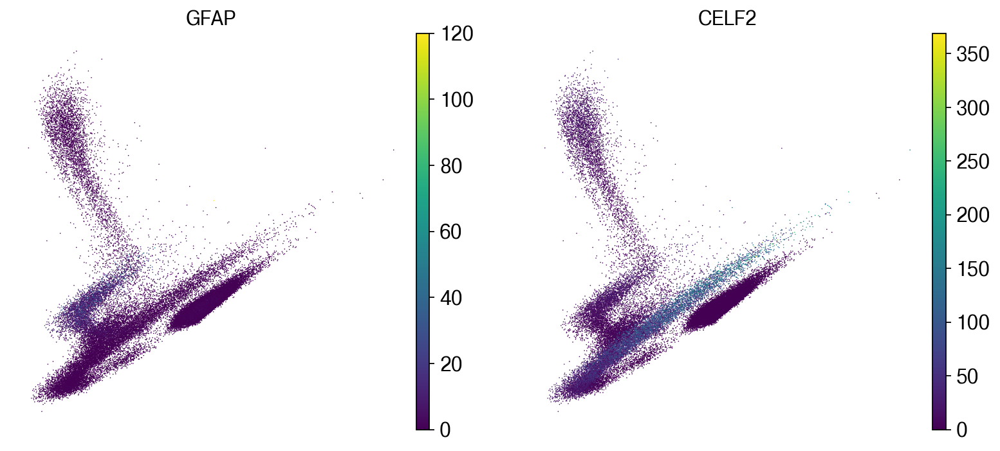

In [20]:
sc.pl.pca(adata, color=['GFAP', 'CELF2'])

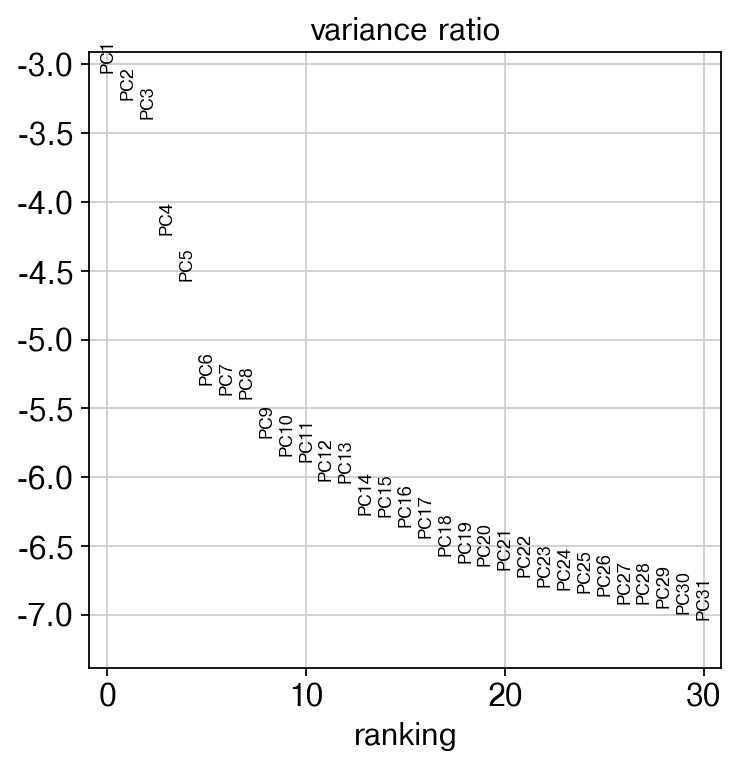

In [21]:
sc.pl.pca_variance_ratio(adata, log=True)

In [22]:
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=40)
sc.tl.umap(adata)

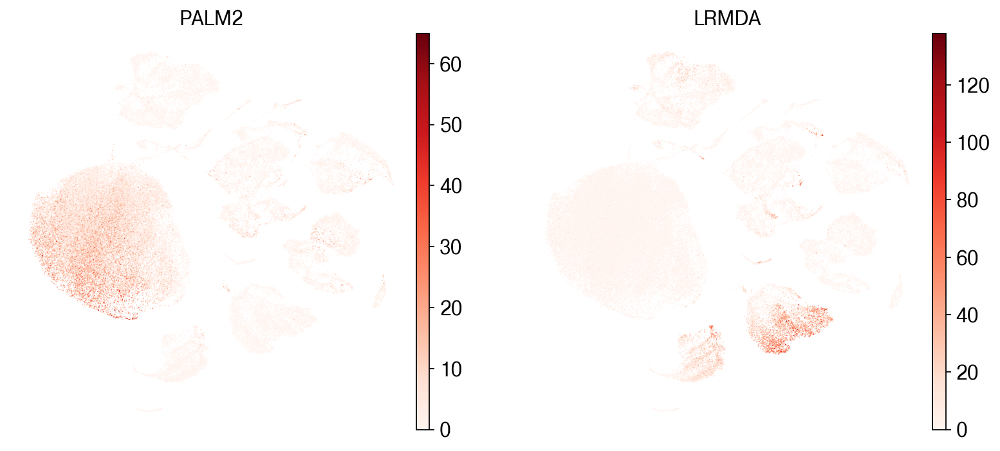

In [23]:
sc.pl.umap(adata, color=['PALM2', 'LRMDA'], palette="Set2", color_map=mpl.cm.Reds)

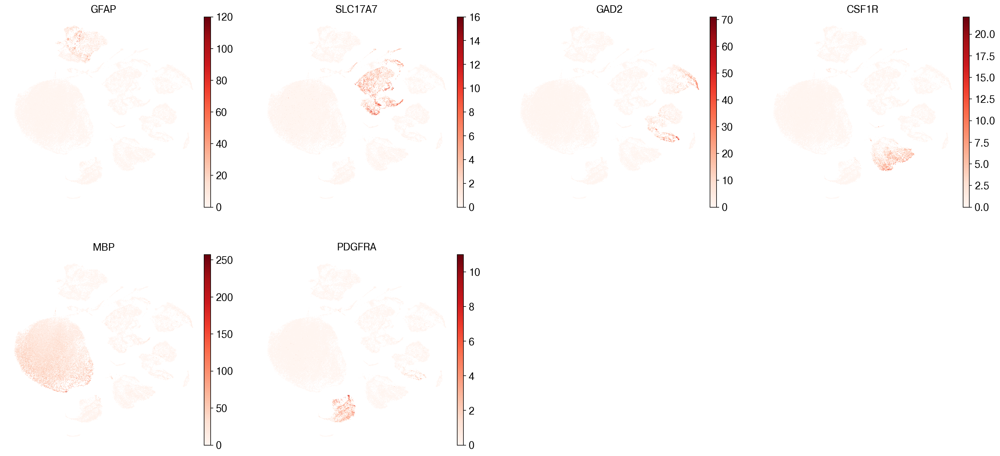

In [24]:
sc.pl.umap(adata, color=['GFAP', 'SLC17A7', 'GAD2', 'CSF1R', 'MBP', 'PDGFRA'], palette="Set2", color_map=mpl.cm.Reds)

In [25]:
sc.tl.leiden(adata)

/home/hani/miniconda3/envs/scenicplus/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


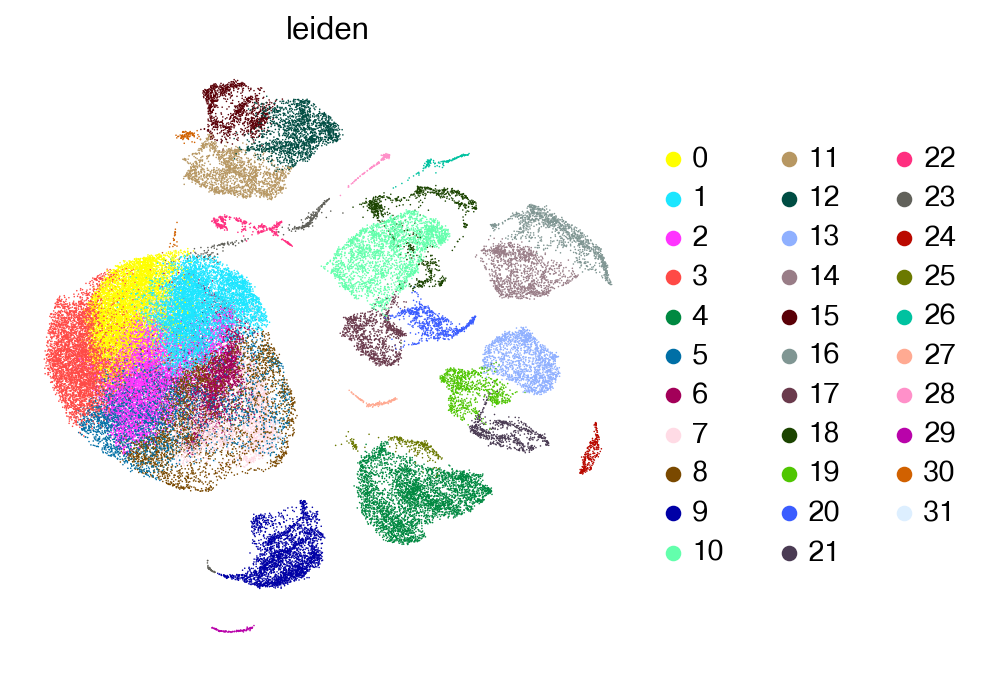

In [26]:
sc.pl.umap(adata, color=['leiden'])

/home/hani/miniconda3/envs/scenicplus/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


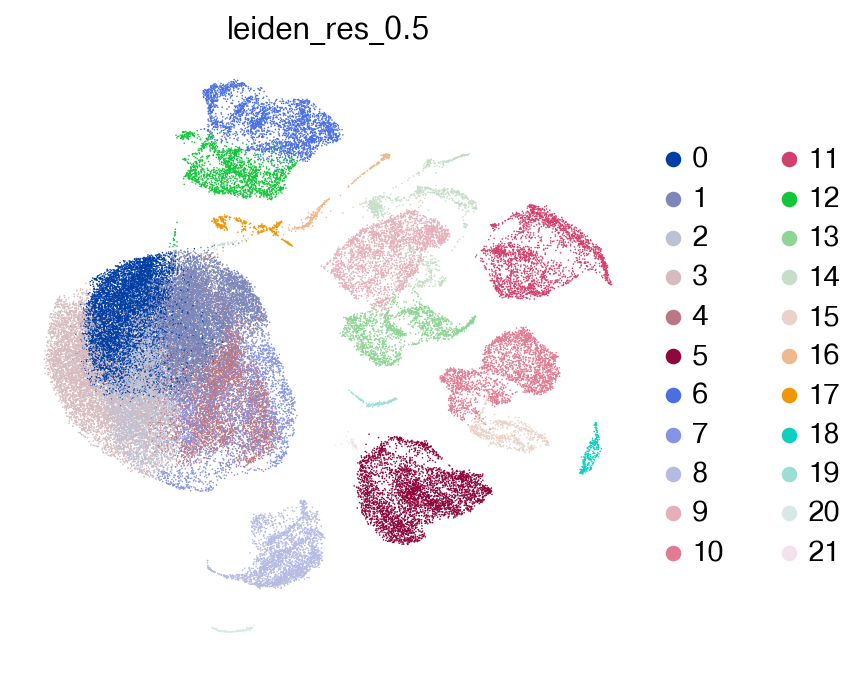

In [27]:
sc.tl.leiden(adata, resolution = 0.5, key_added = 'leiden_res_0.5')
sc.pl.umap(adata, color = 'leiden_res_0.5')

/home/hani/miniconda3/envs/scenicplus/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


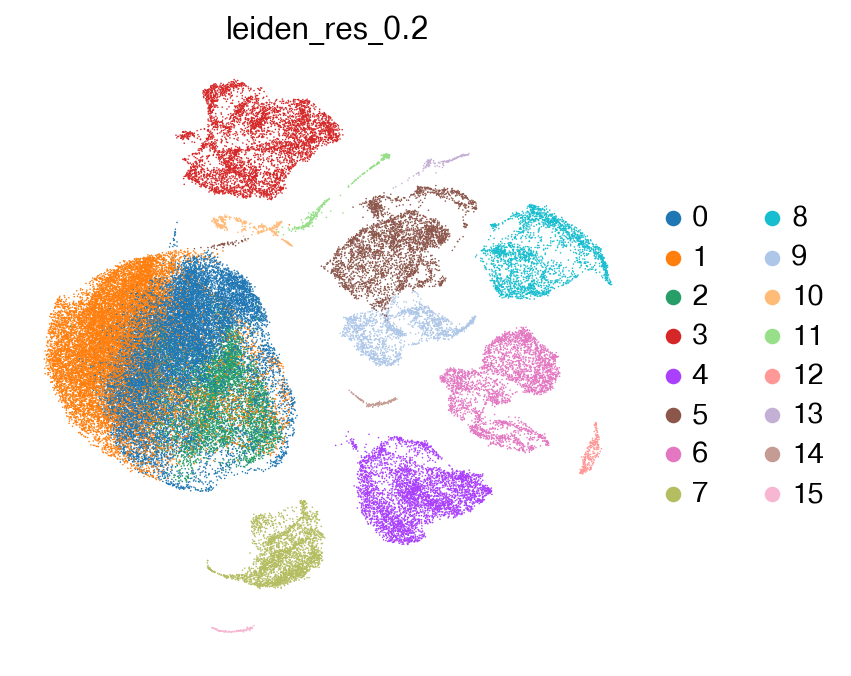

In [28]:
sc.tl.leiden(adata, resolution = 0.2, key_added = 'leiden_res_0.2')
sc.pl.umap(adata, color = 'leiden_res_0.2')

/home/hani/miniconda3/envs/scenicplus/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


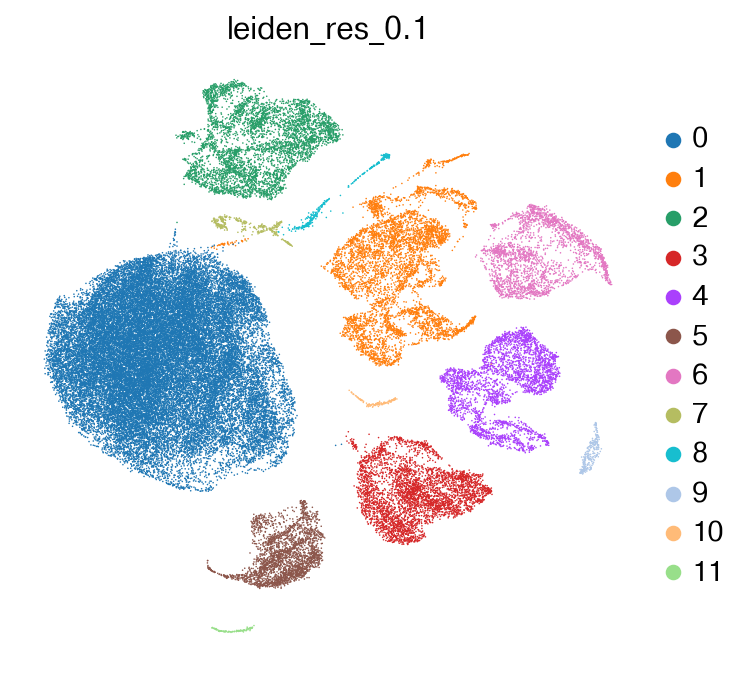

In [29]:
sc.tl.leiden(adata, resolution = 0.1, key_added = 'leiden_res_0.1')
sc.pl.umap(adata, color = 'leiden_res_0.1')

/home/hani/miniconda3/envs/scenicplus/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


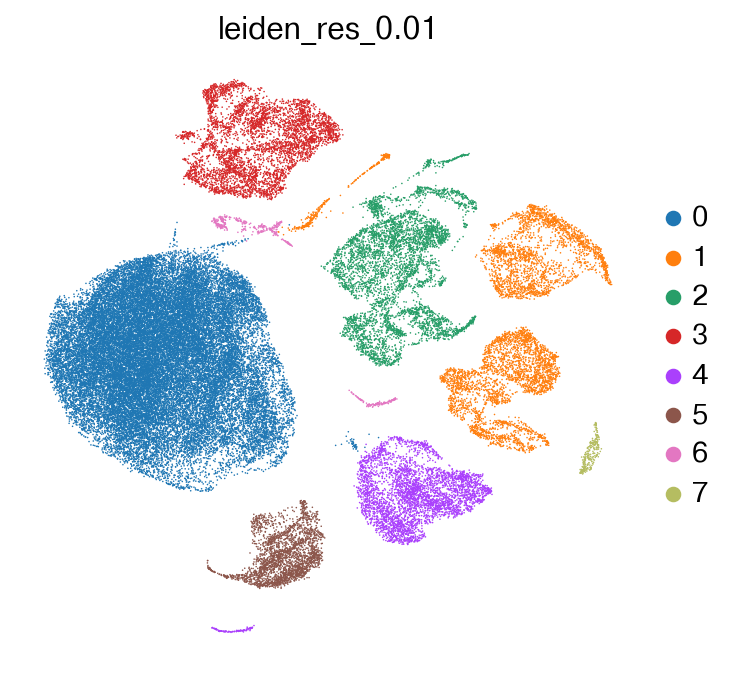

In [30]:
sc.tl.leiden(adata, resolution = 0.01, key_added = 'leiden_res_0.01')
sc.pl.umap(adata, color = 'leiden_res_0.01')

/home/hani/miniconda3/envs/scenicplus/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/home/hani/miniconda3/envs/scenicplus/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/home/hani/miniconda3/envs/scenicplus/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/home/hani/miniconda3/envs/scenicplus/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/home/hani/miniconda3/envs/scenicplus/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  se

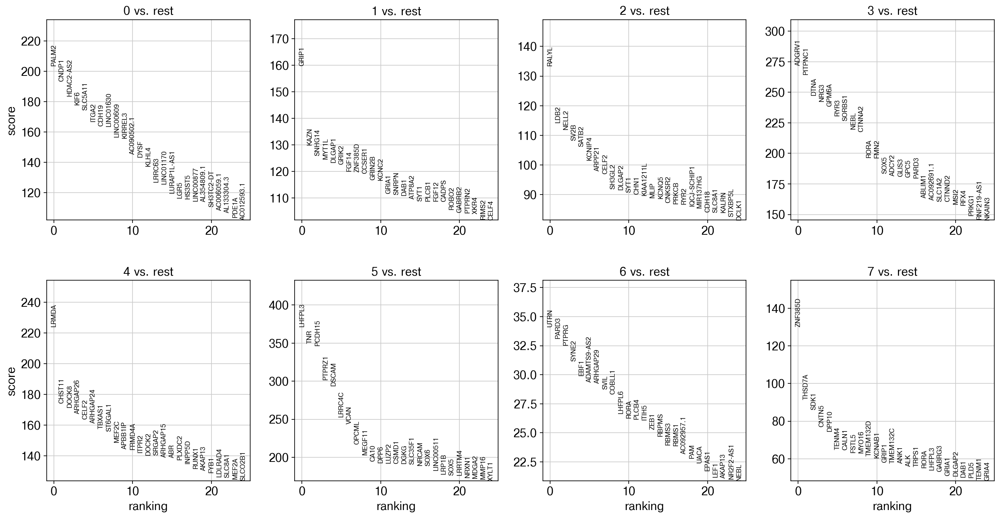

In [31]:
sc.tl.rank_genes_groups(adata, 'leiden_res_0.01', method='t-test', use_raw=False)
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

/home/hani/miniconda3/envs/scenicplus/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/home/hani/miniconda3/envs/scenicplus/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/home/hani/miniconda3/envs/scenicplus/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/home/hani/miniconda3/envs/scenicplus/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/home/hani/miniconda3/envs/scenicplus/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  se

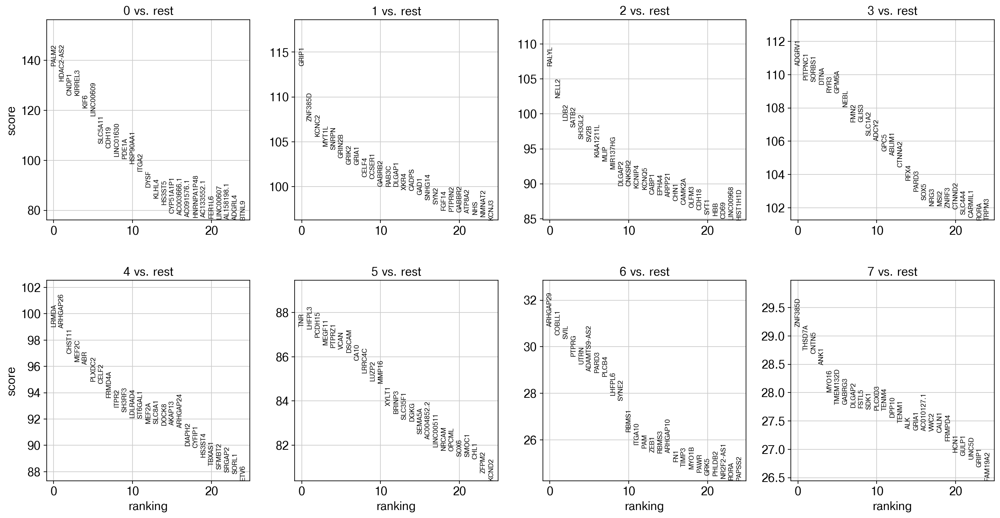

In [32]:
sc.tl.rank_genes_groups(adata, 'leiden_res_0.01', method='wilcoxon', use_raw=False)
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

/home/hani/miniconda3/envs/scenicplus/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


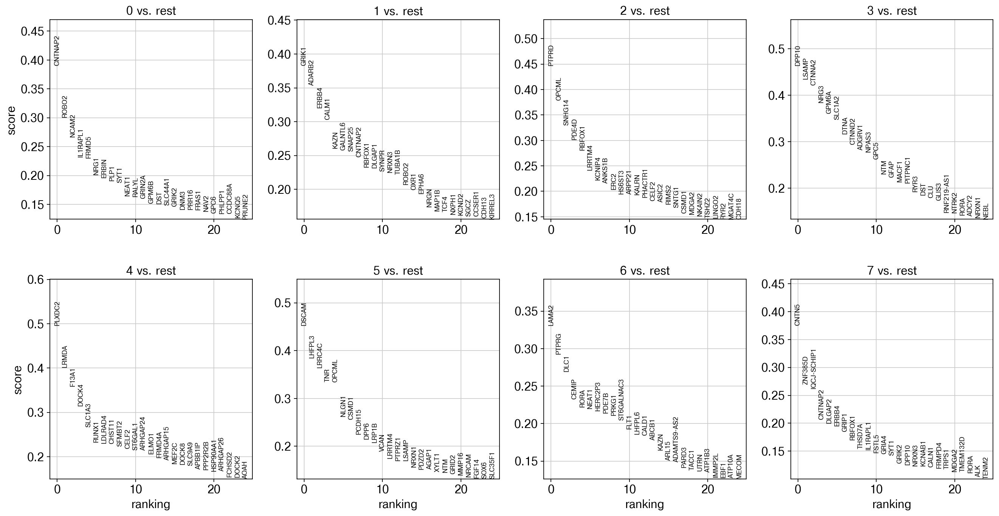

In [33]:
sc.tl.rank_genes_groups(adata, 'leiden_res_0.01', method='logreg')
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

# Cell type annotation from the Nature paper

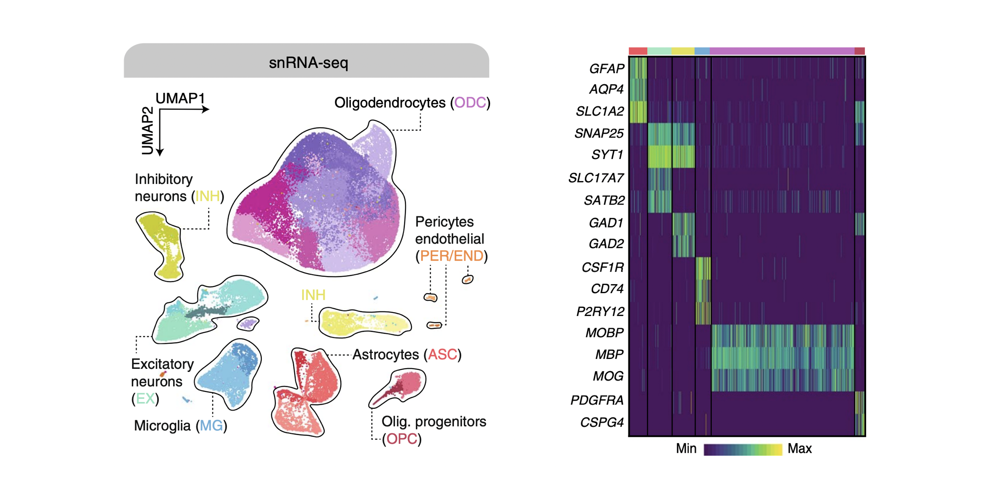

# Manual cell type annotation

In [34]:
# Marker genes from supplementary information
EX1 = ['LAMP5', 'LINC00507']
EX2 = ['RORB']
EX3 = ['RORB', 'THEMIS']
EX4 = ['FEZF2']
EX5 = ['NRGN']
INH1 = ['VIP']
INH2 = ['PVALB']
INH3 = ['SST']
INH4 = ['LAMP5']
excinh_genes = list(set(EX1 + EX2 + EX3 + EX4 + EX5 + INH1 + INH2 + INH3 + INH4))
astrocyte_genes = ['GFAP', 'WIF1', 'ADAMTS17', 'TNC', 'CHI3L1', 'CHI3L2']
microglial_genes = ['SPP1', 'CD163', 'CX3CR1', 'ETS1']
oligodendrocyte_genes = ['ITPR2', 'OPALIN', 'CNP', 'CD47']

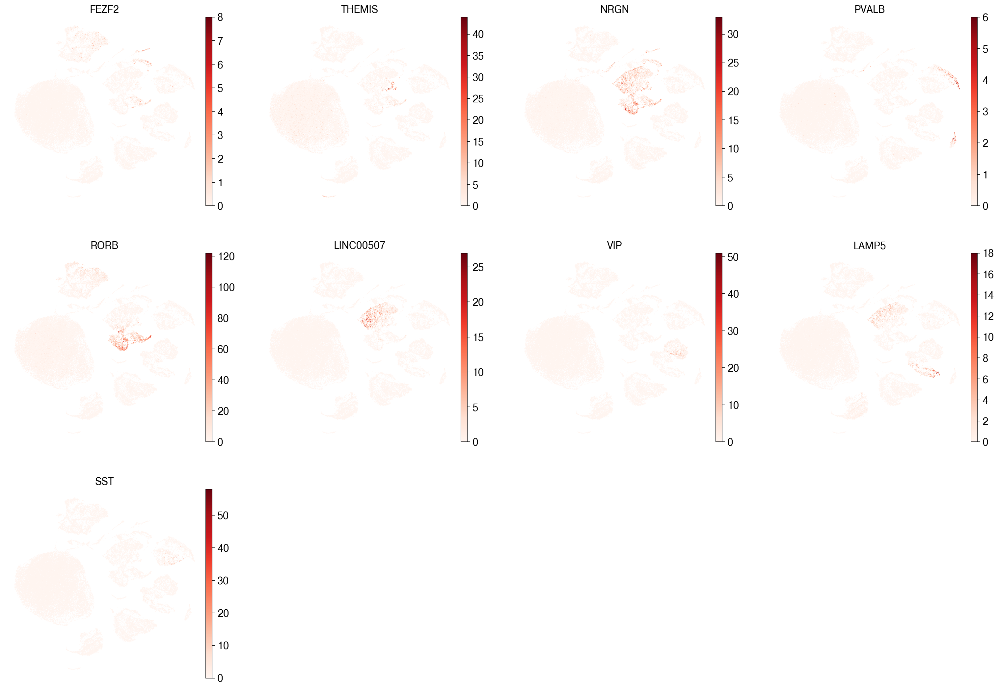

In [35]:
sc.pl.umap(adata, color=excinh_genes, palette="Set2", color_map=mpl.cm.Reds)

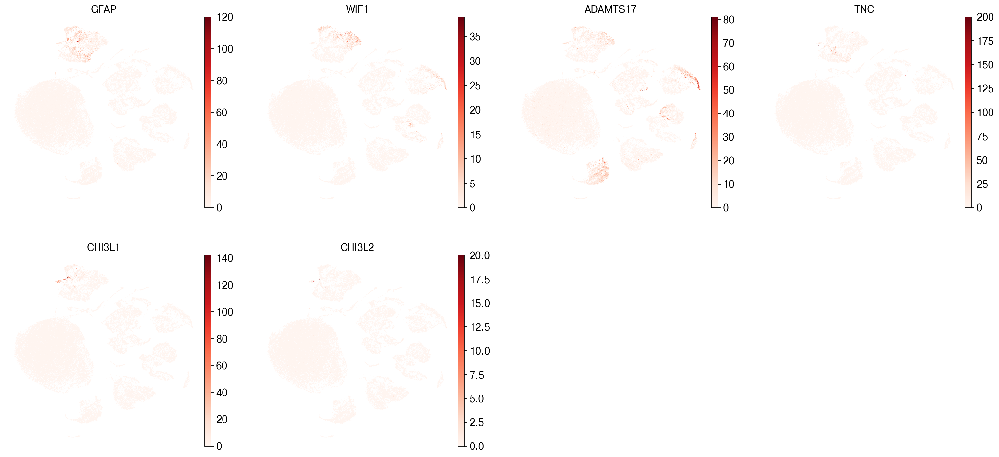

In [36]:
sc.pl.umap(adata, color=astrocyte_genes, palette="Set2", color_map=mpl.cm.Reds)

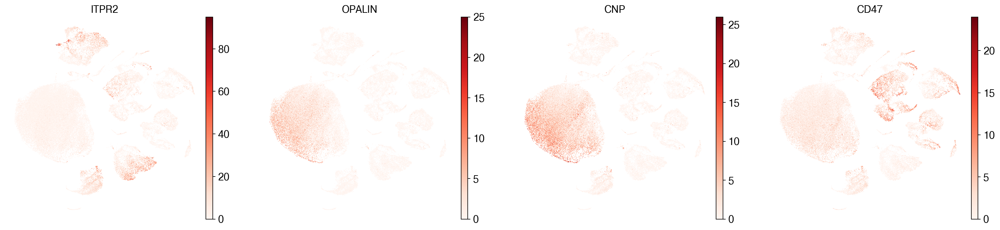

In [37]:
sc.pl.umap(adata, color=oligodendrocyte_genes, palette="Set2", color_map=mpl.cm.Reds)

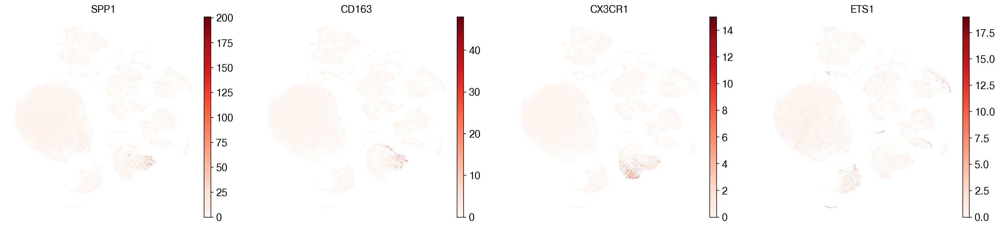

In [38]:
sc.pl.umap(adata, color=microglial_genes, palette="Set2", color_map=mpl.cm.Reds)

`
ODC: Oligodendrocytes
EXC: Excitatory Neurons
INH: Inhibitory Neurons
ASC: Astrocytes
MG: Microglia
OPC: Oligodendrocytes Progenitors
`

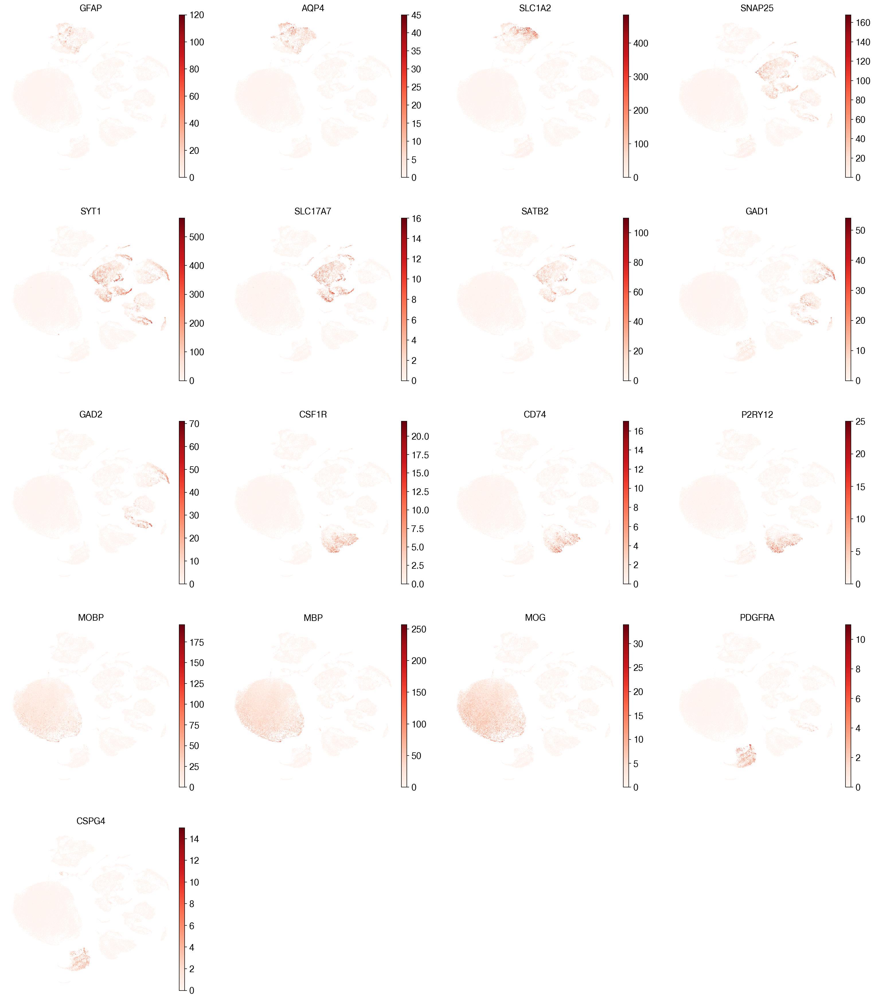

In [39]:
other_markers=['GFAP','AQP4','SLC1A2','SNAP25','SYT1','SLC17A7','SATB2',
               'GAD1','GAD2','CSF1R','CD74','P2RY12','MOBP','MBP','MOG','PDGFRA',
               'CSPG4']
sc.pl.umap(adata, color=other_markers, palette="Set2", color_map=mpl.cm.Reds)

/home/hani/miniconda3/envs/scenicplus/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


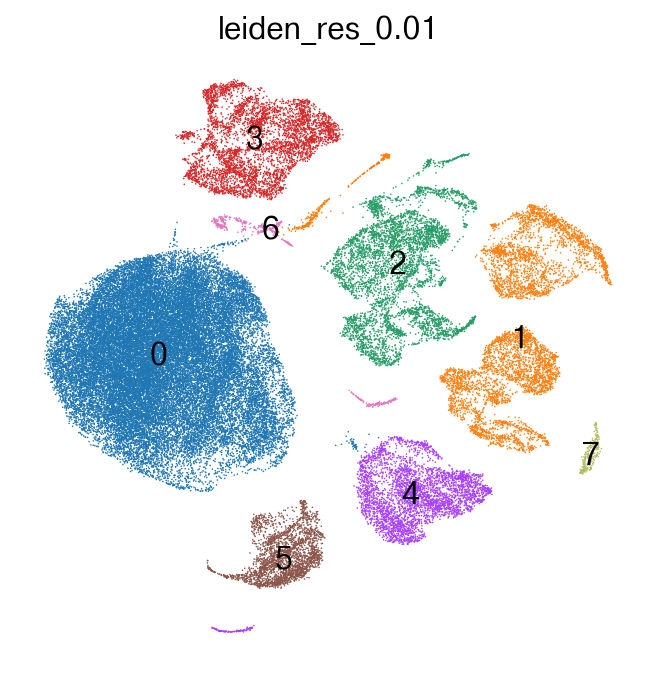

In [40]:
sc.pl.umap(adata, color = 'leiden_res_0.01', legend_loc='on data')

/home/hani/miniconda3/envs/scenicplus/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


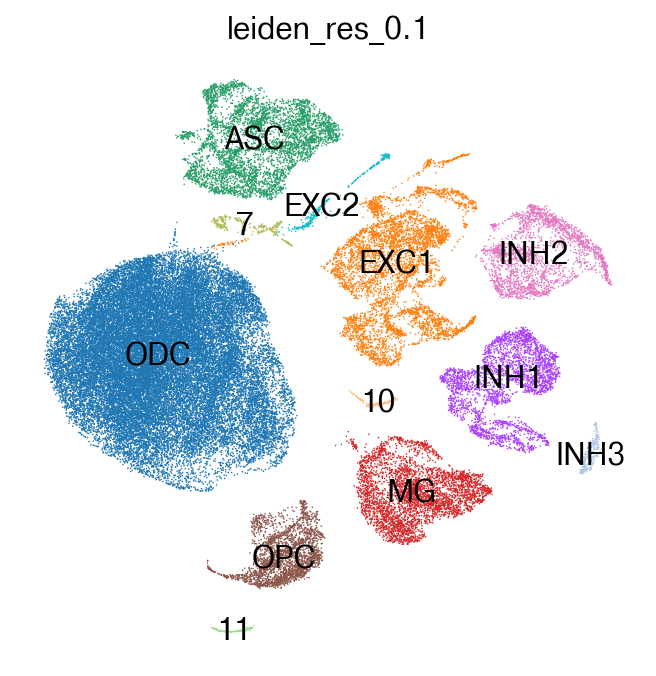

In [44]:
annotations = ['ODC', 'EXC1', 'ASC', 'MG', 'INH1', 'OPC', 'INH2', '7', 'EXC2', 'INH3', '10', '11']
adata.rename_categories('leiden_res_0.01', annotations)
sc.pl.umap(adata, color = 'leiden_res_0.01', legend_loc='on data')

# Cell type annotation via metadata

/home/hani/miniconda3/envs/scenicplus/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


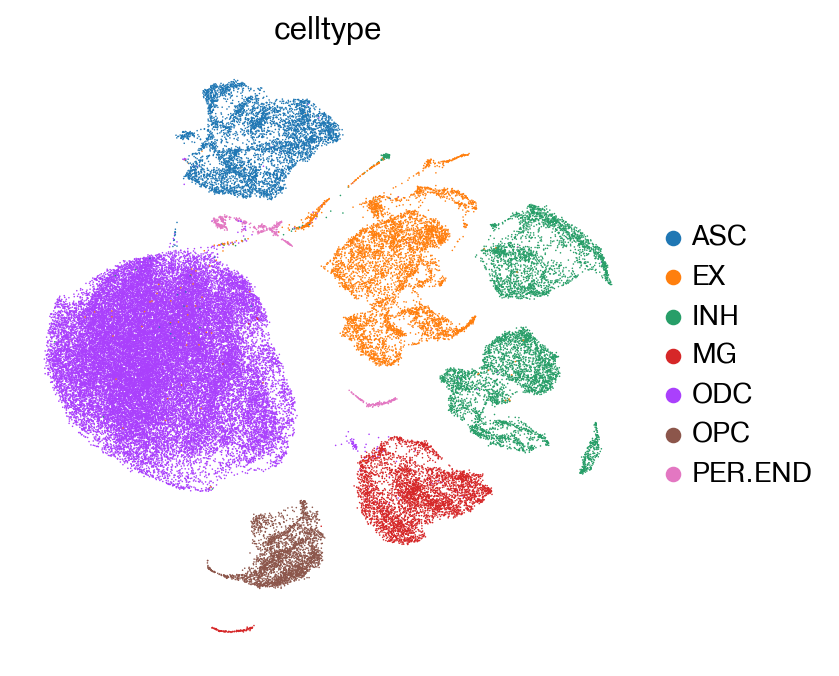

In [41]:
sc.pl.umap(adata, color='celltype')

# Saving the data

In [40]:
adata.raw.to_adata().write('alzheimers.raw.h5ad')
adata.write('alzheimers.h5ad', compression='gzip') 

# ATAC-seq data